In [134]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from random import randrange

In [135]:
pd.set_option('display.max_row', 111)
pd.set_option('display.max_column', 111)

data = pd.read_csv("../Data-tests/KaDo.csv")
df = data.copy()
# small_df = data.copy()[:500]
# small_df.head()

In [136]:
to_drop = ['MOIS_VENTE', 'PRIX_NET', 'UNIVERS', 'CLI_ID']
df.drop(to_drop, inplace=True, axis=1)

In [137]:
df.astype({"TICKET_ID": object})
df.head()

,TICKET_ID,FAMILLE,MAILLE,LIBELLE
0,35592159,HYGIENE,HYG_JDM,GD JDM4 PAMPLEMOUSSE FL 200ML
1,35592159,HYGIENE,HYG_JDM,GD JDM4 PAMPLEMOUSSE FL 200ML
2,35592159,SOINS DU VISAGE,VIS_JEUNE_ET_LEVRE,CR JR PARF BIO.SPE AC.SENT.50ML
3,35592159,SOINS DU VISAGE,VIS_AAAR_DEMAQLOTION,EAU MICELLAIRE 3 THES FL200ML
4,35592159,HYGIENE,HYG_JDM,GD JDM4 TIARE FL 200ML


In [139]:
df_save = df.copy()

In [140]:
df = df_save.copy()

In [143]:
index = randrange(df.shape[0])
index

7192197

In [144]:
libelle = df['LIBELLE'].values[index]
libelle

'RAL CR HYD ROSE THE CN3 09 3.7'

In [146]:
df_cart = df.copy()
df_cart = df_cart.query("LIBELLE == '" + libelle + "'")
df_cart.head()

,TICKET_ID,FAMILLE,MAILLE,LIBELLE
1954,34867110,MAQUILLAGE,MAQ_LEV_RAL_HMG,RAL CR HYD ROSE THE CN3 09 3.7
7381,35203212,MAQUILLAGE,MAQ_LEV_RAL_HMG,RAL CR HYD ROSE THE CN3 09 3.7
7545,33067907,MAQUILLAGE,MAQ_LEV_RAL_HMG,RAL CR HYD ROSE THE CN3 09 3.7
8394,33737750,MAQUILLAGE,MAQ_LEV_RAL_HMG,RAL CR HYD ROSE THE CN3 09 3.7
8396,34163317,MAQUILLAGE,MAQ_LEV_RAL_HMG,RAL CR HYD ROSE THE CN3 09 3.7


In [147]:
df_all_cart = df.loc[df['TICKET_ID'].isin(df_cart['TICKET_ID'])]
df_all_cart = df_all_cart.query("LIBELLE != '" + libelle + "'")
df_all_cart.head()

,TICKET_ID,FAMILLE,MAILLE,LIBELLE
1955,34867110,SOINS DU CORPS,CORPS_HYDRA_NOURRI_ET_SOINS,SVC 3en1 nutritotal T150ml
1956,34867110,SOINS DU CORPS,CORPS_HYDRA_NOURRI_ET_SOINS,SVC CREME QUOTIDIENNE T75ml
7544,33067907,MAQUILLAGE,MAQ_YEUX_CLASSIQUE,PORTE MINE BLEU FLASH 02 CN3 0.3G
7546,33067907,SOINS DU CORPS,CORPS_HYDRA_NOURRI_ET_SOINS,SVC 3en1 nutritotal T150ml
7547,33067907,SOINS DU CORPS,CORPS_HYDRA_NOURRI_ET_SOINS,HUILE SECHE SUBLIMANTE 100 ML SVC
...,...,...,...,...
7224528,36379688,MAQUILLAGE,MAQ_YEUX_CLASSIQUE,"PORTE MINE YX ANTHRACITE CN3 0,3G"
7224529,36379688,MAQUILLAGE,MAQ_TEINT,STICK COR ZERO DEF BGE CLAIR01 CN3 1.4G
7224530,36379688,SOINS DU VISAGE,VIS_JEUNE_ET_LEVRE,MSQ CRANBERRY BTE CROQUER T50
7242856,35648811,PARFUMAGE,PARF_PARFUM,EDT UN MATIN AU JARDIN 100ML MUGUET


In [159]:
serie_libelle_count = df_all_cart["LIBELLE"].value_counts()
serie_libelle_count.head()

DEMAQ EXPRESS PUR BLEUET FL125ML    83
PORTE MINE NOIR 01 CN3 0.3G         45
LINGETTES CALMILLE 2013             42
MASC SEXYPULP NOIR 01 CN3 9ML       39
SVC REP LAIT REP T150ML             39
Name: LIBELLE, dtype: int64

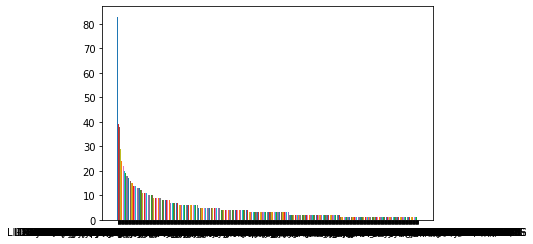

In [149]:
for idx, val in zip(serie_libelle_count.index, serie_libelle_count.values):
    plt.bar(idx, val)

In [177]:
quantile = serie_libelle_count.quantile(.75)
df_count_all = df_all_cart.copy()
df_count_all["COUNT"] = df_count_all['LIBELLE'].map(serie_libelle_count)
df_count_all = df_count_all.query("COUNT > " + str(quantile))
df_count_all.head()

,TICKET_ID,FAMILLE,MAILLE,LIBELLE,COUNT
1955,34867110,SOINS DU CORPS,CORPS_HYDRA_NOURRI_ET_SOINS,SVC 3en1 nutritotal T150ml,9
1956,34867110,SOINS DU CORPS,CORPS_HYDRA_NOURRI_ET_SOINS,SVC CREME QUOTIDIENNE T75ml,34
7544,33067907,MAQUILLAGE,MAQ_YEUX_CLASSIQUE,PORTE MINE BLEU FLASH 02 CN3 0.3G,13
7546,33067907,SOINS DU CORPS,CORPS_HYDRA_NOURRI_ET_SOINS,SVC 3en1 nutritotal T150ml,9
7547,33067907,SOINS DU CORPS,CORPS_HYDRA_NOURRI_ET_SOINS,HUILE SECHE SUBLIMANTE 100 ML SVC,9


In [181]:
df_all_cart.shape

(3952, 4)

In [182]:
df_count_all.shape

(2200, 5)

In [178]:
df_count_all = df_count_all.sort_values(by=['COUNT'], ascending=False)
df_count_all.head(20)

,TICKET_ID,FAMILLE,MAILLE,LIBELLE,COUNT
6497121,33840464,SOINS DU VISAGE,VIS_AUTRES,DEMAQ EXPRESS PUR BLEUET FL125ML,83
633392,36141583,SOINS DU VISAGE,VIS_AUTRES,DEMAQ EXPRESS PUR BLEUET FL125ML,83
3462627,35407370,SOINS DU VISAGE,VIS_AUTRES,DEMAQ EXPRESS PUR BLEUET FL125ML,83
2474981,36258150,SOINS DU VISAGE,VIS_AUTRES,DEMAQ EXPRESS PUR BLEUET FL125ML,83
935205,33079244,SOINS DU VISAGE,VIS_AUTRES,DEMAQ EXPRESS PUR BLEUET FL125ML,83
6372785,35541407,SOINS DU VISAGE,VIS_AUTRES,DEMAQ EXPRESS PUR BLEUET FL125ML,83
6190996,33131546,SOINS DU VISAGE,VIS_AUTRES,DEMAQ EXPRESS PUR BLEUET FL125ML,83
2511497,35573893,SOINS DU VISAGE,VIS_AUTRES,DEMAQ EXPRESS PUR BLEUET FL125ML,83
3812111,35293981,SOINS DU VISAGE,VIS_AUTRES,DEMAQ EXPRESS PUR BLEUET FL125ML,83
6358379,34450064,SOINS DU VISAGE,VIS_AUTRES,DEMAQ EXPRESS PUR BLEUET FL125ML,83


<AxesSubplot:xlabel='LIBELLE'>

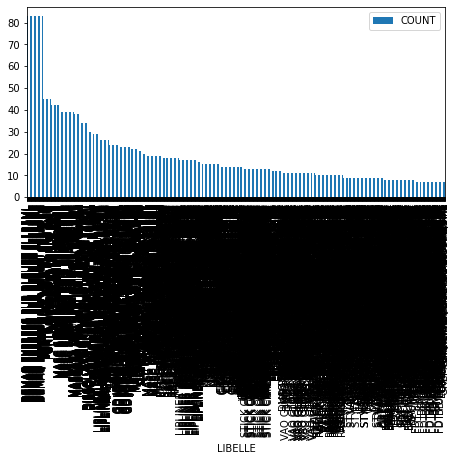

In [168]:
df_count_all.plot.bar(x="LIBELLE", y="COUNT")


In [169]:
len(df_count_all["MAILLE"].unique())

24

In [214]:
serie_maille_count = df_count_all.groupby(['MAILLE'])['LIBELLE'].count()
serie_maille_count.sort_values(ascending=False).head()

MAILLE
MAQ_YEUX_CLASSIQUE             251
MAQ_LEV_RAL_HMG                218
HYG_JDM                        215
CORPS_HYDRA_NOURRI_ET_SOINS    172
MAQ_YEUX_MASCA_EYEL_FARD       168
Name: LIBELLE, dtype: int64

In [220]:
quantile = serie_maille_count.quantile(.75)
df_count_maille = df_count_all.copy()
df_count_maille.drop(['FAMILLE', 'COUNT', 'LIBELLE', 'TICKET_ID'], inplace=True, axis=1)
# df_count_all.head()
df_count_maille["COUNT_MAILLE"] = df_count_maille['MAILLE'].map(serie_maille_count)
# df_count_maille = df_count_maille.query("COUNT_MAILLE > " + str(quantile))
df_count_maille.sort_values(by=['COUNT_MAILLE'], ascending=False).head()

,MAILLE,COUNT_MAILLE
3450771,MAQ_YEUX_CLASSIQUE,251
1037653,MAQ_YEUX_CLASSIQUE,251
3669536,MAQ_YEUX_CLASSIQUE,251
6251346,MAQ_YEUX_CLASSIQUE,251
4767470,MAQ_YEUX_CLASSIQUE,251


<function matplotlib.pyplot.show(close=None, block=None)>

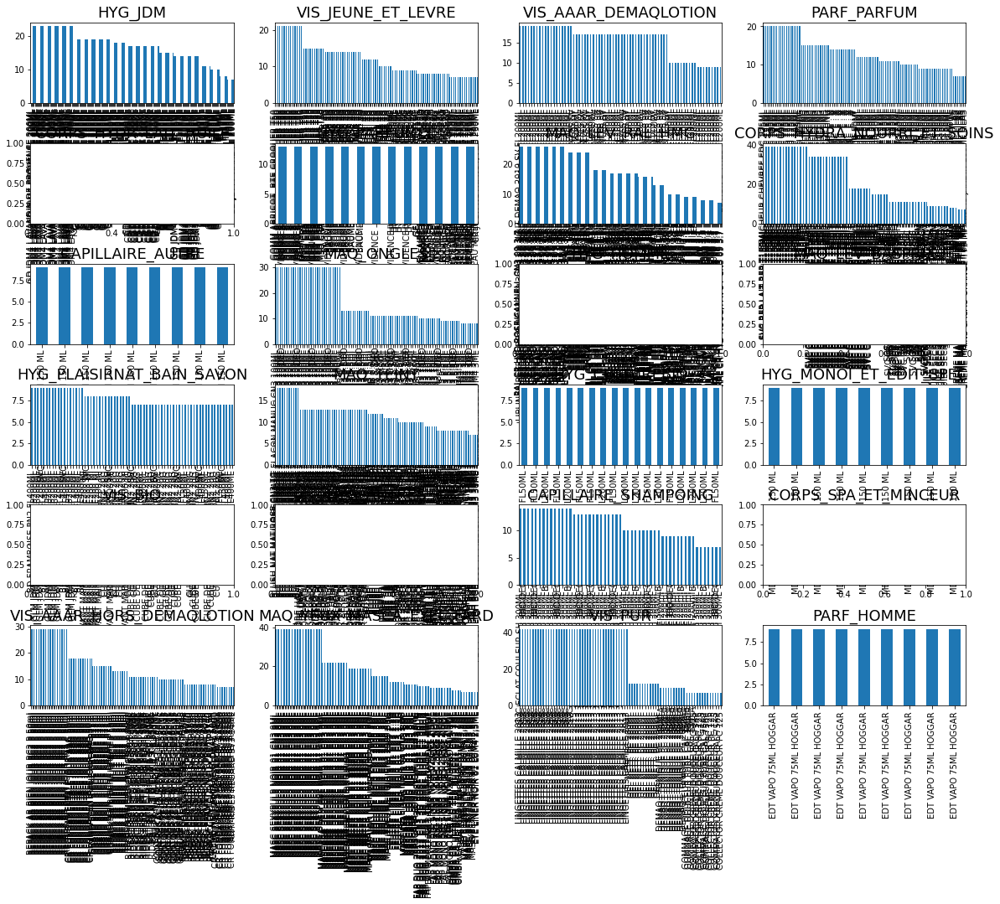

In [204]:
mailles = df["MAILLE"].unique()
length = len(mailles)
data_list = []
nrow=6
ncol=4
fig, axes = pplt.subplots(nrow, ncol, figsize=(20,15))

pplt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.5)
for i, ax in enumerate(axes.ravel()): # 2
    ax.set_title(mailles[i], fontsize=18) # 3

count = 0
for r in range(nrow):
    for c in range(ncol):
        df_maille = df_count_all.query("MAILLE == '" + mailles[count] + "'") 
        if (df_maille.shape[0]) :
            df_maille.plot.bar(x="LIBELLE", y="COUNT", ax=axes[r,c], legend=False, xlabel="")
        count += 1

pplt.show

In [202]:
len(df_count_all["FAMILLE"].unique())

7

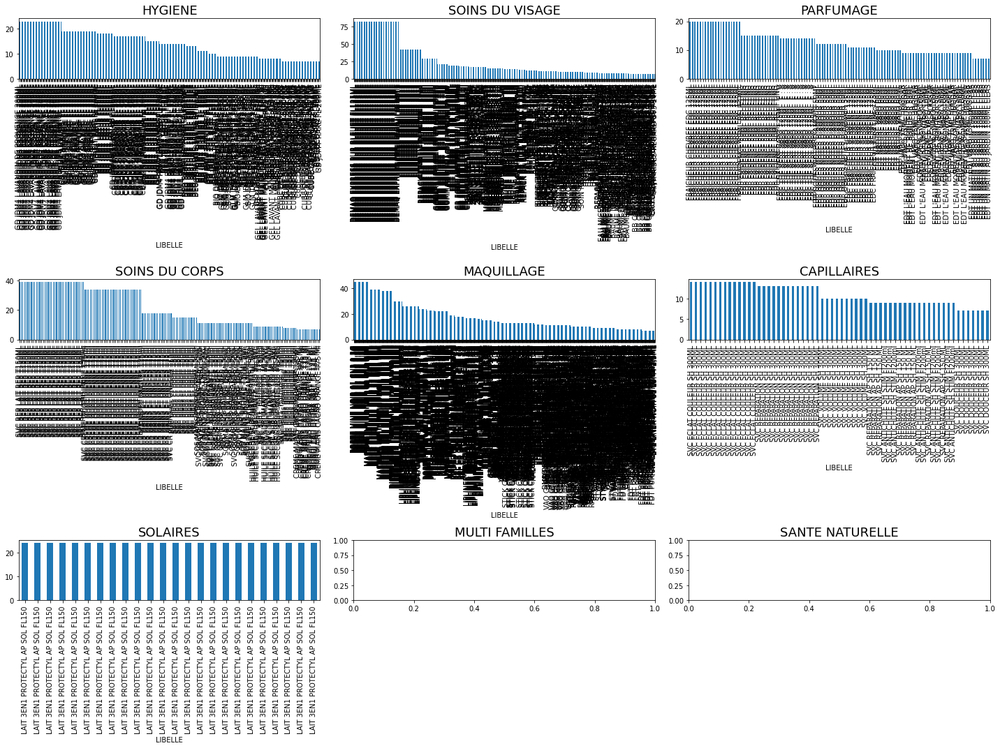

In [203]:
familles = df["FAMILLE"].unique()
length = len(familles)
data_list = []
nrow=3
ncol=3
fig, axes = pplt.subplots(nrow, ncol, figsize=(20,15))

pplt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.5)
for i, ax in enumerate(axes.ravel()): # 2
    ax.set_title(familles[i], fontsize=18) # 3

count = 0
for r in range(nrow):
    for c in range(ncol):
        df_famille = df_count_all.query("FAMILLE == '" + familles[count] + "'")        
        if (df_famille.shape[0]) :
            df_famille.plot.bar(x="LIBELLE", y="COUNT", ax=axes[r,c], legend=False)
        count += 1